## Imports:

In [15]:
import os
import copy
import numpy as np
import pandas as pd
import statistics as stat
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import random
from typing import Union as U
import Transforms as T
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

## Helper Functions and Global Variables:

In [16]:
seed = 0
generator_switch = False


def ring_density(radii):
    num_rings = len(radii)
    separation_sum = 0
    for i in range(len(radii) - 1):
        separation_sum += radii[i + 1] - radii[i]
    return separation_sum / num_rings

def complete_average(num_list, target_average):
    current_sum = sum(num_list)
    target_len = len(num_list) + 1
    x = (target_average - current_sum) * target_len
    return x

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    # torch.manual_seed(seed)

def split_train_test(data: pd.DataFrame(), train_ratio: float=0.45, valid_ratio: float=0.45,
                      test_ratio: float=0.1):
    num_samples = len(data)
    num_train = int(train_ratio * num_samples)
    num_valid = int(valid_ratio * num_samples)
    num_test = int(test_ratio * num_samples)
    train_df = data.sample(n=num_train)
    data = data.drop(train_df.index)
    valid_df = data.sample(n=num_valid)
    data = data.drop(valid_df.index)
    test_df = data

    return train_df, valid_df, test_df

## Generator Class Initialization:

In [17]:
seed = 0

set_seed(seed)

Vector = U[tuple, list, np.ndarray]

class npy_generator:
    def __init__(self, seed_label: str='Seed_Image', child_label: str='Child_Image',
                  image_shape: Vector=[1920, 1920], num_rings: int=3, ring_variance: bool=False,
                 inner_radius_fixed: bool=False, inner_radius: float=0.2):
        
        self.file_ext = '.npy'
        
        self.seed_label = seed_label # General File Name for Seed Images
        self.child_label = child_label # General File Name for Child Images
        self.seed_list = []
        self.child_list = []
        self.base_labels = ['sub_dir', 'file_name', 'file_ext', 'image_width','image_height', 'center_x_ratio','center_y_ratio', 'num_rings']
        self.num_rings = num_rings
        self.radii_labels = [f'radius_{idx}' for idx in range(1, num_rings + 1)]
        self.seed_frame = pd.DataFrame(columns=self.data_labels)
        self.child_frame = pd.DataFrame(columns = self.data_labels)

        self.image_shape = image_shape
        self.image_center = [int(image_shape[0]/2), int(image_shape[1]/2)]
        self.IC_unit_ratio = [0.5, 0.5] # Image center coordinates as ratios of the image shape
        self.center_data = np.zeros(self.image_shape) # Helper Layer
        self.center_data[self.image_center[0], self.image_center[1]] = 1 # Helper Layer
        self.image_data = np.zeros(self.image_shape) # Initialize image data
        self.max_shape = max(image_shape)
        self.min_shape = min(image_shape)

        self.num_rings = num_rings # Inidicate maximum number of rings to create in an image
        self.ring_variance = ring_variance # Indicate whether ring generation should be randomized or uniform
        self.ring_width_range = [0.0001 * self.max_shape, 0.008 * self.max_shape] # Range for ring thickness
        if inner_radius_fixed:
            self.inner_radius = inner_radius
        else:
            self.inner_radius = None
        
        self.y, self.x = np.ogrid[0:image_shape[0], 0:image_shape[1]] # Create an open mesh grid which will be used to create shapes in our initialized image
        self.circ_eq = (self.x - self.image_center[0])**2 + (self.y - self.image_center[1])**2 # Establish circle equation to be used for defining shapes in the ogrid
    


# ____________________________________/CREATION FUNCTIONS\__________________________________________

    def create_seed_npy(self, save_npy: bool=False, num_images: int=1, save_subdir: str='Seed Set', overlay: bool=False): 
        radius_bound = 0.45 * self.min_shape # Establish maximum radius (we want the rings to be bound by the image_shape)
        os.makedirs(save_subdir, exist_ok=True) # Create save directory

        print(f'Attempting to generate {num_images} images')       
        for index in range(1, num_images + 1):
            # Initialize a list of radii to define the rings. The generative method appends the predefined inner radius to the front of the list
            # and then appends cumulatively increasing radii to the list until the number of radii generated equals the number of rings to be created.
            if self.inner_radius is not None:
                radii_normed = np.cumsum(np.concatenate((np.array([self.inner_radius]), np.random.random(self.num_rings - 1))))
            else:
                radii_normed = np.cumsum(np.random.random(self.num_rings))


            min_radius = radii_normed[0] # First radius is the smallest due to np.cumsum
            max_radius = radii_normed[-1] # Last radius in the list is largest due to np.cumsum

            radii_pixel = radii_normed / max_radius * radius_bound
            
            if overlay == False: # If True, then the images generated will maintain radii from previous images (the final image will have several radii)
                self.image_data = np.zeros(self.image_shape)
                
            print(f'Generating image {index}')
            if self.ring_variance == True:
                num_rings = random.randint(2, self.num_rings)
            else:
                num_rings = self.num_rings    
            
            radii_keys = self.radii_labels[0:num_rings]
            radii_values = list(radii_normed[0:num_rings])

            for ring in range(0, num_rings):
                
                radius_outer = radii_pixel[ring - 1] # Iterate over radii list
                
                radius_inner = radius_outer - random.uniform(self.ring_width_range[0], self.ring_width_range[1])

                    
                if len(self.image_shape) == 3: # Colored image creation
                    
                    pass
                    
                else: # Binary image creation

                    mask_outer = self.circ_eq <= radius_outer**2 # Shade inward from outer radius
                    mask_inner = self.circ_eq > radius_inner**2 # Shade outward from inner radius
                    self.image_data[mask_outer & mask_inner] = 1 # Implement intersection of both shades to actual image data
                    
            file_path = os.path.join(save_subdir, f'{self.seed_label}({index})')

            if save_npy:
                np.save(file_path + self.file_ext, self.image_data)

            base_keys = self.base_labels
            base_values = [save_subdir, f'{self.seed_label}({index})', self.file_ext, int(self.image_shape[0]), int(self.image_shape[1]),
                           self.IC_unit_ratio[0], self.IC_unit_ratio[1], num_rings]
            
            combined_keys = [*base_keys, *radii_keys]
            combined_values = [*base_values, *radii_values]

            self.seed_list.append({key: value for key, value in zip(combined_keys, combined_values)})

        self.seed_frame = pd.DataFrame(self.seed_list)

        return None


    def create_child_npy(self, save_npy: bool=False, save_subdir: str='Child Set', num_seeds: int=5, num_children: int=5):
        os.makedirs(save_subdir, exist_ok=True)
        print(f'Attempting to generate {num_children} child images per seed - of which there are {num_seeds}')
        Transforms = [T.Random_Shift(), T.Random_Rotate(), T.Random_Patch(max_num_patch=15)]
        seed_dir = self.seed_frame['sub_dir'][0]
        print(f'Seed directory = {seed_dir}')

        for seed_idx in range(1, num_seeds + 1):
            print(f'{os.path.join(seed_dir, self.seed_frame["file_name"][seed_idx - 1] + self.file_ext)}')
            npy_path = os.path.join(seed_dir, self.seed_frame['file_name'][seed_idx - 1] + self.file_ext)
            seed_img = np.load(npy_path)
            num_rings = self.seed_frame['num_rings'][seed_idx - 1]

            for child_idx in range(1, num_children + 1):
                print(f'Generating child image {child_idx} from seed {seed_idx}')
                child_path = os.path.join(save_subdir, f'{self.seed_label}({seed_idx})-{self.child_label}({child_idx})')
                child_img = seed_img # Initialize child image data with seed data
                helper = copy.deepcopy(self.center_data)
                
                for transform in Transforms: # Apply transformations to seed data to create unique child
                    child_img, helper = transform(child_img, helper)
                
                indices = np.where(helper == 1)
                x, y, n = 0, 0, 0
                for coord in zip(*indices):
                    x += coord[1]
                    y += coord[0]
                    n += 1

                x, y = x/n, y/n
                x_ratio, y_ratio = x/helper.shape[1], y/helper.shape[0]

                if save_npy:
                    np.save(child_path + self.file_ext, child_img)

                base_keys = self.base_labels
                base_values = [save_subdir, f'{self.seed_label}({seed_idx})-{self.child_label}({child_idx})', self.file_ext,
                               int(child_img.shape[0]), int(child_img.shape[1]), x_ratio, y_ratio, num_rings]
                
                combined_keys = [*base_keys, radii]


                self.child_list.append({
                'sub_dir': save_subdir,
                'file_name': f'{self.seed_label}({seed_idx})-{self.child_label}({child_idx})',
                'file_ext' : self.file_ext,
                'image_width': int(child_img.shape[0]),
                'image_height': int(child_img.shape[1]),
                'center_x_ratio': x_ratio,
                'center_y_ratio': y_ratio, 
                'num_rings': int(num_rings)})
        
        self.child_frame = pd.DataFrame(self.child_list)

        return None



# _________________________/DATA FRAME UTILITIES\__________________________

    def display_frame_head(self, frame: str='seed', n: int=5):
        if frame == 'seed':
            return self.seed_frame.head(n)
        if frame == 'child':
            return self.child_frame.head(n)
    

    def display_frame_info(self, frame: str='seed'):
        if frame == 'seed':
            return self.seed_frame.info()
        if frame == 'child':
            return self.child_frame.info()
    

    def save_frame(self, frame: str='seed', storage_method: str='pickle'):
        if frame == 'seed':
            df = self.seed_frame
        if frame == 'child':
            df = self.child_frame

        if storage_method == 'pickle':
            df.to_pickle(f'{frame}_set.pickle')

        if storage_method == 'csv':
            df.to_csv(f'{frame}_set.csv')


    def load_frame(self, frame: str='seed'):
        if frame == 'seed':
            self.seed_frame = pd.read_pickle('seed_set.pickle')
        if frame == 'child':
            self.child_frame = pd.read_pickle('child_set.pickle')

    def return_frame(self, frame: str='seed'):
        if frame == 'seed':
            return self.seed_frame
        if frame == 'child':
            return self.child_frame


# __________________________________/DISPLAY FUNCTION\________________________________________

    def display_npy(self, target_idx: int=1, children_per_seed: int=5, frame: str='seed', iterative: bool=False):
        if frame == 'seed':
            df = self.seed_frame
        if frame == 'child':
            df = self.child_frame
            target_idx = target_idx * children_per_seed

        sub_dir = df['sub_dir'][0]

        if iterative == True:
            for idx in range(1, target_idx + 1):
                image_title = df['file_name'][idx - 1]
                image_path = os.path.join(sub_dir, image_title + self.file_ext)
                image = np.load(image_path)
                plt.imshow(image, cmap='gray')
                plt.title(f'{image_title}') 
                plt.show()
        else:
            image_title = df['file_name'][target_idx - 1]
            image_path = os.path.join(sub_dir, image_title + self.file_ext)
            image = np.load(image_path)
            plt.imshow(image, cmap='gray')
            plt.title(f'{image_title}')
            plt.show()




## Call Generator:

In [18]:
def generate(switch):
    if switch:
        global dimension
        dimension = int(input('Please input the dimension of the images to generate: '))
        num_rings = int(input('Please input the maximum number of rings to show up in the training images: '))
        num_seeds = int(input('Please input the number of seed images you would like to generate: '))
        num_children = int(input('Please input the number of children images you would like to generate per seed image: '))
        
        generator = npy_generator(image_shape=[dimension, dimension], num_rings=num_rings, ring_variance=True, inner_radius=0.1)
        generator.create_seed_npy(num_images=num_seeds, save_npy=True)
        generator.create_child_npy(save_npy=True, num_seeds=num_seeds, num_children=num_children)

        generator.save_frame(frame='child')

        generator.display_frame_head(frame='seed')
        generator.display_frame_head(frame='child')

        # generator.display_npy(target_idx=4, frame='child', iterative=True)    

generate(switch=generator_switch)

### Load Dataframe:

In [19]:
generator = npy_generator()
generator.load_frame(frame='child')
child_df = generator.return_frame(frame='child')
if not generator_switch:
    global dimension
    dimension = child_df['image_width'][0]
child_df.head()

,sub_dir,file_name,file_ext,image_width,image_height,center_x_ratio,center_y_ratio,num_rings
0,Child Set,Seed_Image(1)-Child_Image(1),.npy,240,240,0.472917,0.575000,8
1,Child Set,Seed_Image(1)-Child_Image(2),.npy,240,240,0.433333,0.510417,8
2,Child Set,Seed_Image(1)-Child_Image(3),.npy,240,240,0.416667,0.510417,8
3,Child Set,Seed_Image(1)-Child_Image(4),.npy,240,240,0.577778,0.559722,8
4,Child Set,Seed_Image(1)-Child_Image(5),.npy,240,240,0.494444,0.555556,8


#### Randomly Selected Example Image with Ground Truth marked (BLUE)

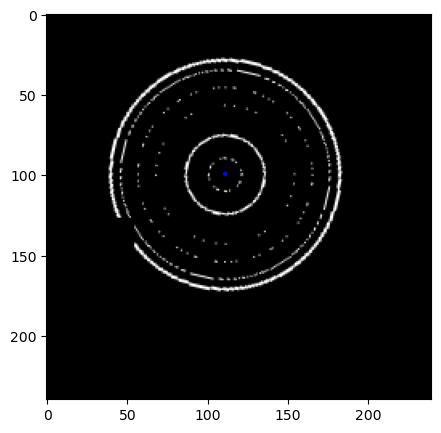

In [20]:
n = random.randint(0, len(child_df))

im = np.load(os.path.join(child_df['sub_dir'][n], child_df['file_name'][n] + child_df['file_ext'][n]))
x, y = child_df['center_x_ratio'][n], child_df['center_y_ratio'][n]
x, y = int(x * dimension), int(y * dimension)

fig, axs = plt.subplots(1, 1, figsize=(15,5))  # create a figure with 3 subplots
axs.imshow(im, cmap='gray')
circ = Circle((x,y), radius=1, color='b')
axs.add_patch(circ)
plt.show()


### Make Train | Test Split:

In [21]:
train_df, valid_df, test_df = split_train_test(data=child_df)
train_df.head()

,sub_dir,file_name,file_ext,image_width,image_height,center_x_ratio,center_y_ratio,num_rings
398,Child Set,Seed_Image(80)-Child_Image(4),.npy,240,240,0.445833,0.439583,10
3833,Child Set,Seed_Image(767)-Child_Image(4),.npy,240,240,0.455556,0.468056,6
4836,Child Set,Seed_Image(968)-Child_Image(2),.npy,240,240,0.500000,0.445833,7
4572,Child Set,Seed_Image(915)-Child_Image(3),.npy,240,240,0.518750,0.450000,5
636,Child Set,Seed_Image(128)-Child_Image(2),.npy,240,240,0.527083,0.585417,6


In [22]:
print(len(train_df), len(valid_df), len(test_df))

2250 2250 500


## Pytorch DataSet and DataLoader:

#### DataSet:

In [23]:
# totensor = transforms.Compose([
#     transforms.Normalize(mean=[0.5], std=[0.5])
# ])

class Circle_Dataset(Dataset):
    def __init__(self, df, transform=None):
        self.image_paths = [os.path.join(row[0], row[1] + row[2]) for row in df.iloc[:, 0:3].to_numpy()]
        self.targets = np.array(df[['center_x_ratio', 'center_y_ratio']])
        self.sample_ids = np.array(df.index)
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image = np.load(self.image_paths[idx])
        image = torch.from_numpy(image).float().unsqueeze(0)
        target = torch.from_numpy(self.targets[idx]).float()
        sample_ids = torch.tensor(self.sample_ids[idx])
        if self.transform is not None:
            image = self.transform(image)
        return image, target, sample_ids
    
    def view_item(self, idx):
        image = np.load(self.image_paths[idx])
        plt.imshow(image, cmap='gray')
        plt.show()

In [24]:
CDS_train = Circle_Dataset(df=train_df)
CDS_valid = Circle_Dataset(df=valid_df)
CDS_test = Circle_Dataset(df=test_df)

#### DataLoader:

In [25]:
batch_size = 250

train_dataloader = DataLoader(dataset=CDS_train, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(dataset=CDS_valid, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(dataset=CDS_test, batch_size=batch_size, shuffle=False)

In [26]:
img_custom, label_custom, sample_ids = next(iter(train_dataloader))

print(f'Image shape: {img_custom.shape} -> [batch_size, color, height, width]')
print(f'Label shape: {label_custom.shape}')
print(f'Sample_ids shape: {sample_ids.shape}')

Image shape: torch.Size([250, 1, 240, 240]) -> [batch_size, color, height, width]
Label shape: torch.Size([250, 2])
Sample_ids shape: torch.Size([250])


#### Model Architecture and Training:

GROUND TRUTH center coordinate (x,y): [107, 118]
PREDICTED center coordinate (x,y): [99, 104]


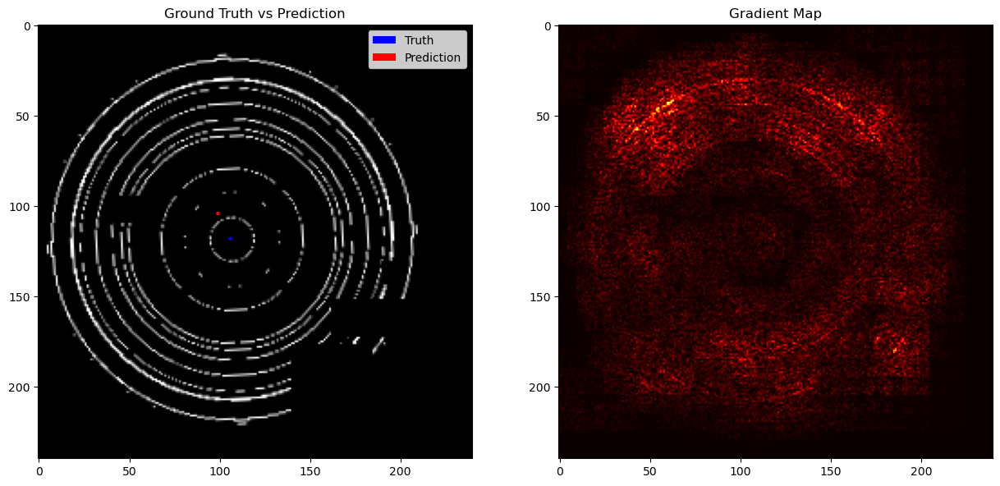

Epoch: 1 	Training Loss: 0.0023766390319603183 	Validation Loss: 0.001241467660292983
GROUND TRUTH center coordinate (x,y): [126, 132]
PREDICTED center coordinate (x,y): [125, 132]


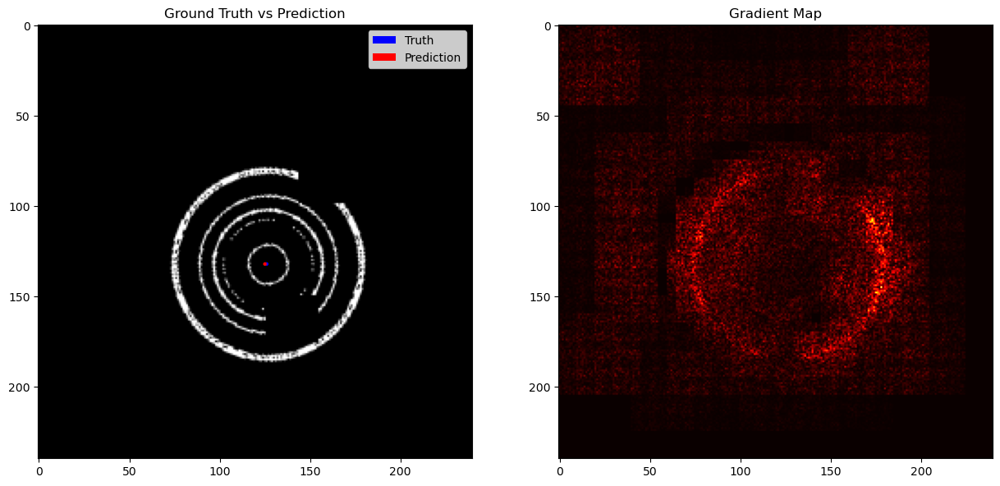

Epoch: 2 	Training Loss: 0.0008940757510976659 	Validation Loss: 0.0007043906500459545
GROUND TRUTH center coordinate (x,y): [94, 119]
PREDICTED center coordinate (x,y): [102, 121]


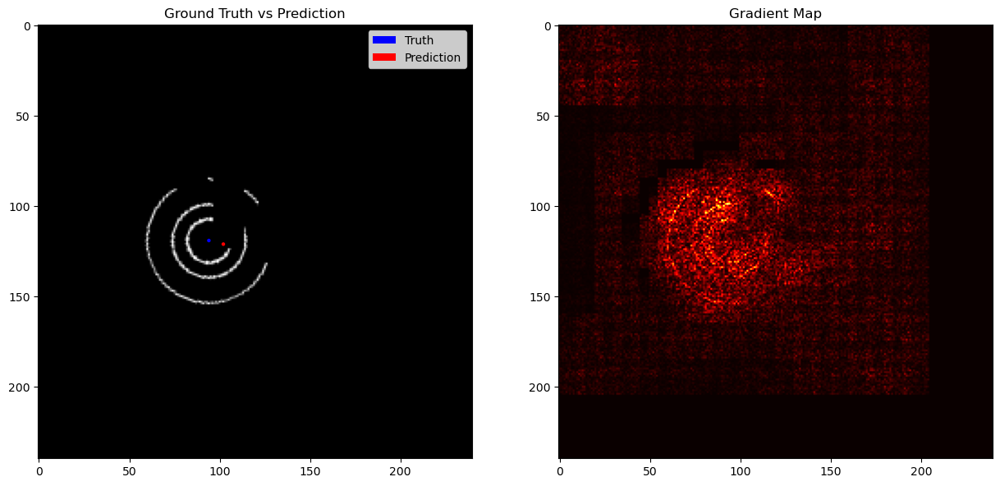

Epoch: 3 	Training Loss: 0.0005685852471894274 	Validation Loss: 0.0004121229447062231
GROUND TRUTH center coordinate (x,y): [112, 117]
PREDICTED center coordinate (x,y): [110, 117]


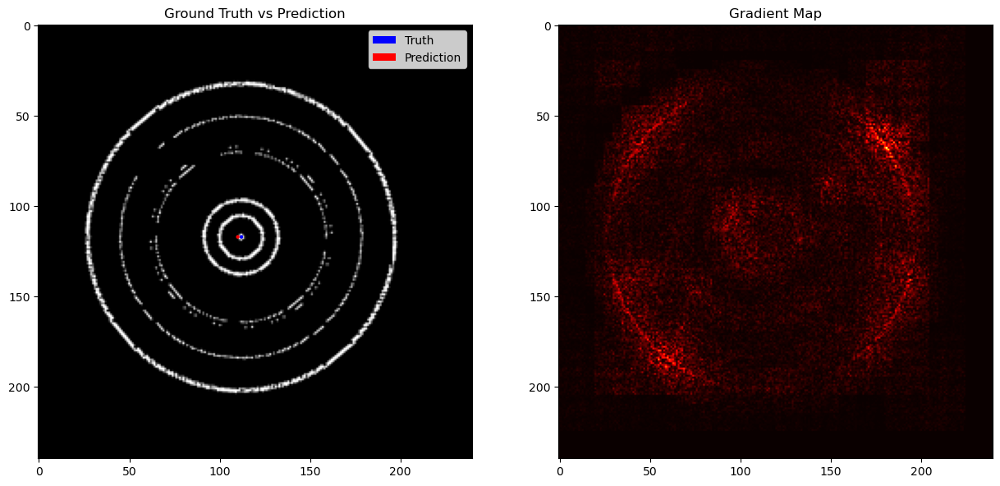

Epoch: 4 	Training Loss: 0.00037066169574649795 	Validation Loss: 0.00032405060483142734
GROUND TRUTH center coordinate (x,y): [98, 112]
PREDICTED center coordinate (x,y): [111, 112]


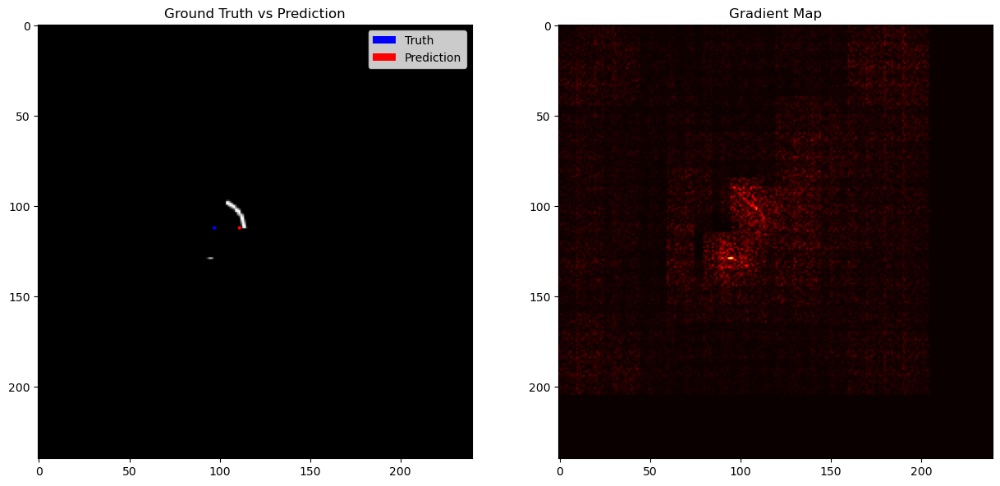

Epoch: 5 	Training Loss: 0.00026782581537392817 	Validation Loss: 0.0002446582948323339
GROUND TRUTH center coordinate (x,y): [105, 102]
PREDICTED center coordinate (x,y): [107, 105]


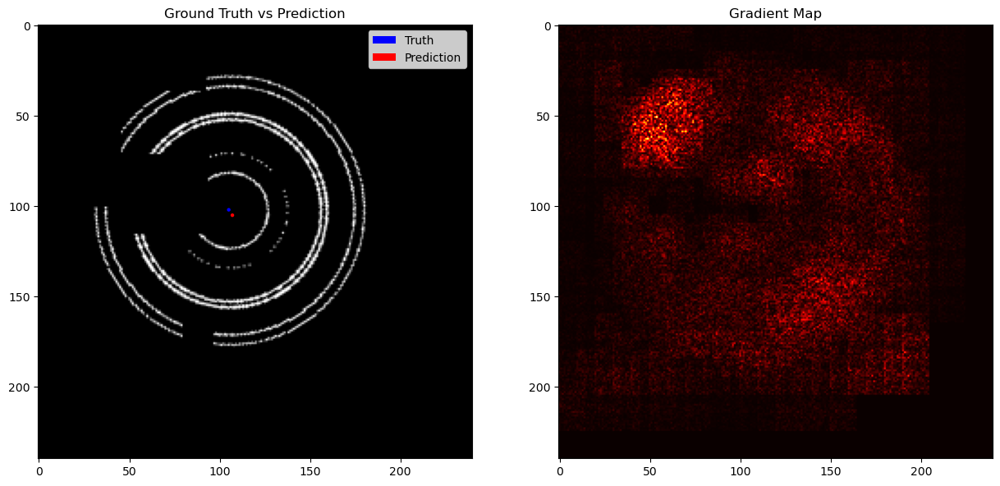

Epoch: 6 	Training Loss: 0.000204292313557946 	Validation Loss: 0.00020620482650378512
GROUND TRUTH center coordinate (x,y): [117, 105]
PREDICTED center coordinate (x,y): [117, 113]


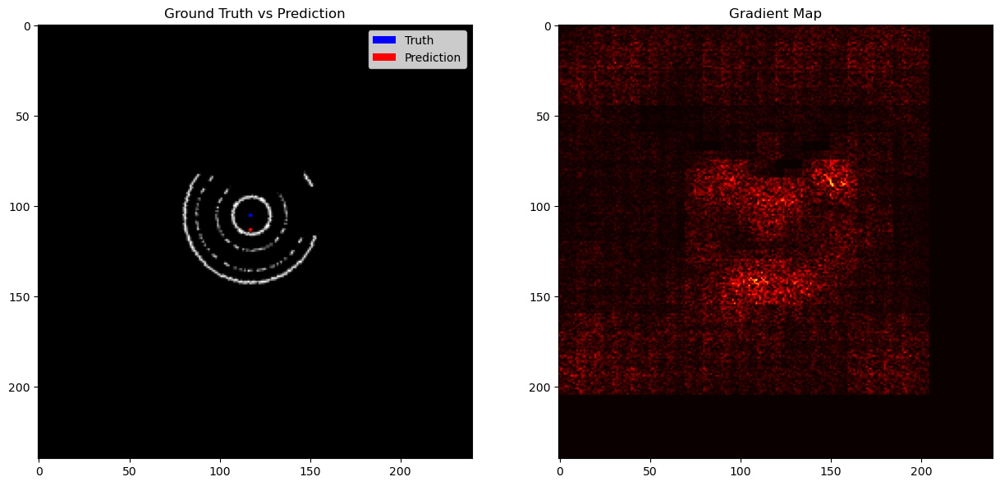

Epoch: 7 	Training Loss: 0.00016402099249211865 	Validation Loss: 0.00017380332024509294
GROUND TRUTH center coordinate (x,y): [146, 115]
PREDICTED center coordinate (x,y): [149, 117]


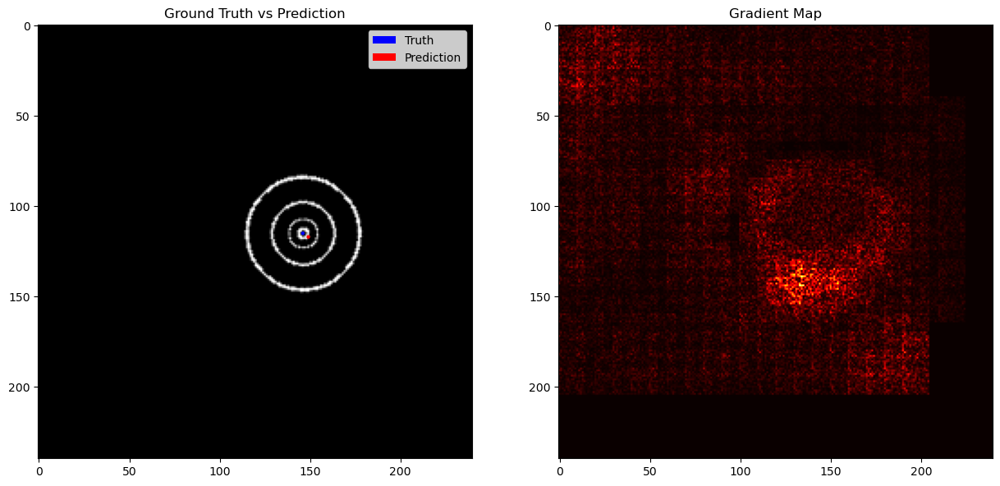

Epoch: 8 	Training Loss: 0.0001288830664836698 	Validation Loss: 0.00014660252943738468
GROUND TRUTH center coordinate (x,y): [117, 126]
PREDICTED center coordinate (x,y): [117, 123]


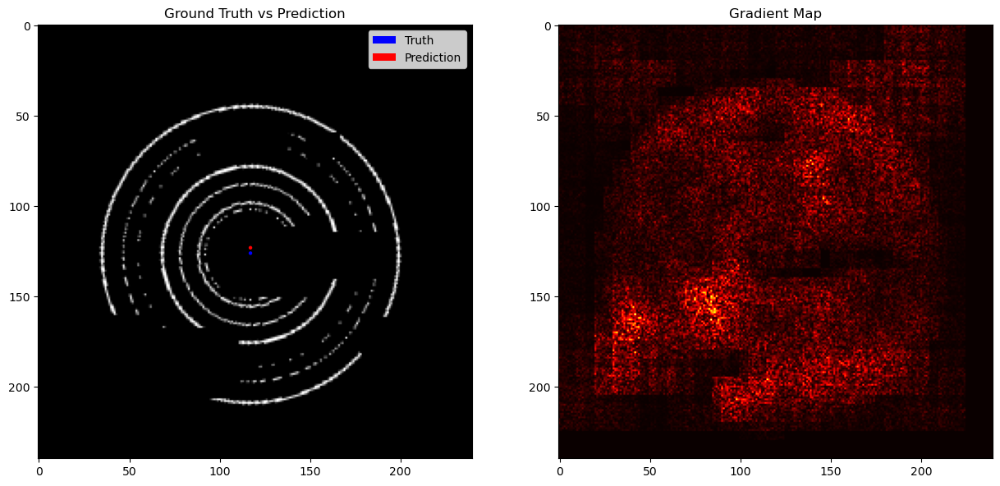

Epoch: 9 	Training Loss: 0.00011036003302756904 	Validation Loss: 0.00013422110189114593
GROUND TRUTH center coordinate (x,y): [118, 111]
PREDICTED center coordinate (x,y): [118, 111]


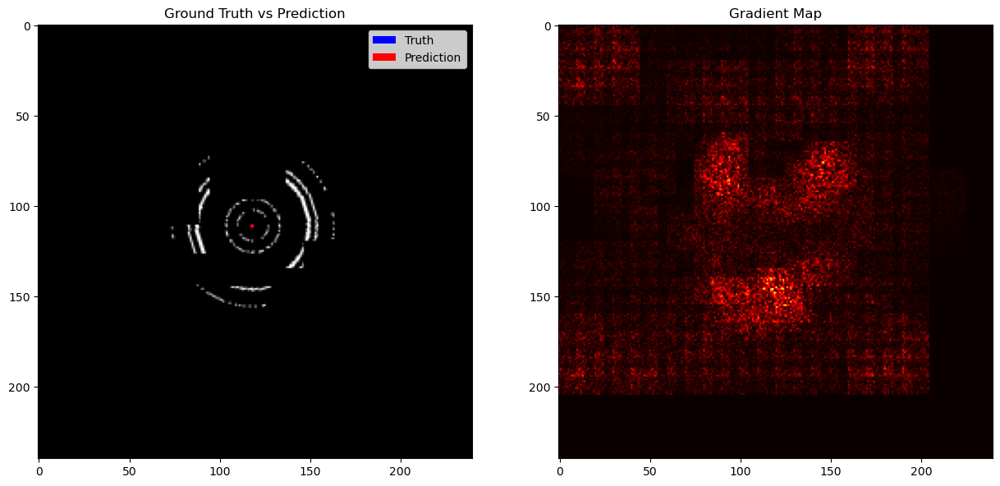

Epoch: 10 	Training Loss: 0.00010115363289110569 	Validation Loss: 0.00011993600734664749
GROUND TRUTH center coordinate (x,y): [106, 114]
PREDICTED center coordinate (x,y): [108, 116]


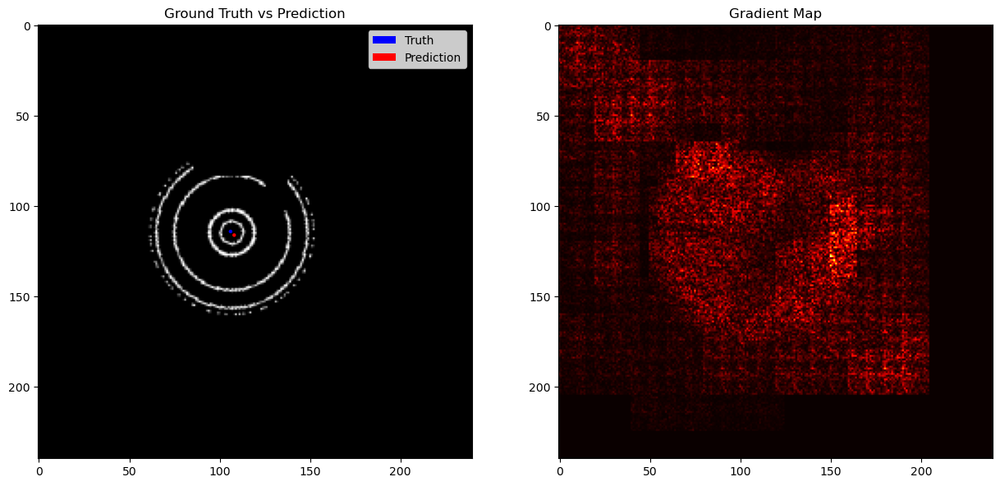

Epoch: 11 	Training Loss: 8.931125679130976e-05 	Validation Loss: 0.00011428050654810957
GROUND TRUTH center coordinate (x,y): [124, 97]
PREDICTED center coordinate (x,y): [121, 102]


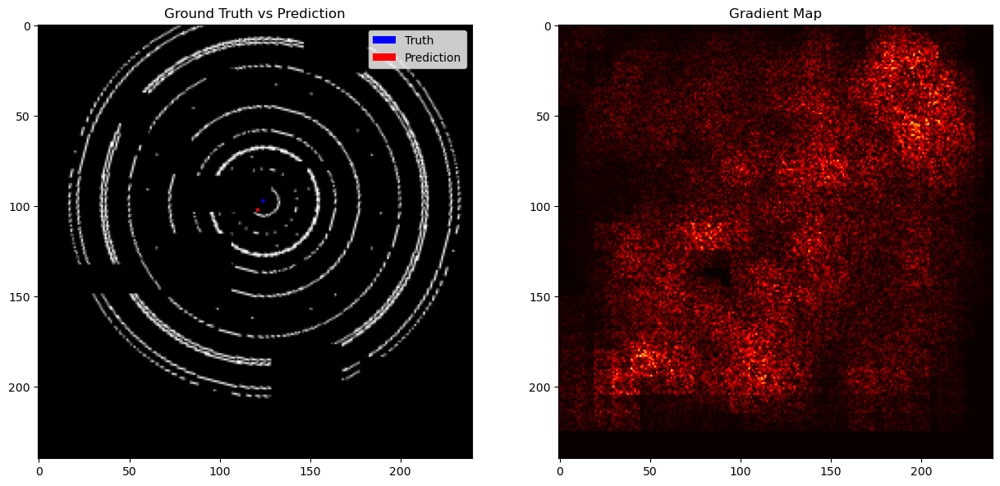

Epoch: 12 	Training Loss: 7.414118509687897e-05 	Validation Loss: 0.0001085075895793529
GROUND TRUTH center coordinate (x,y): [141, 136]
PREDICTED center coordinate (x,y): [137, 131]


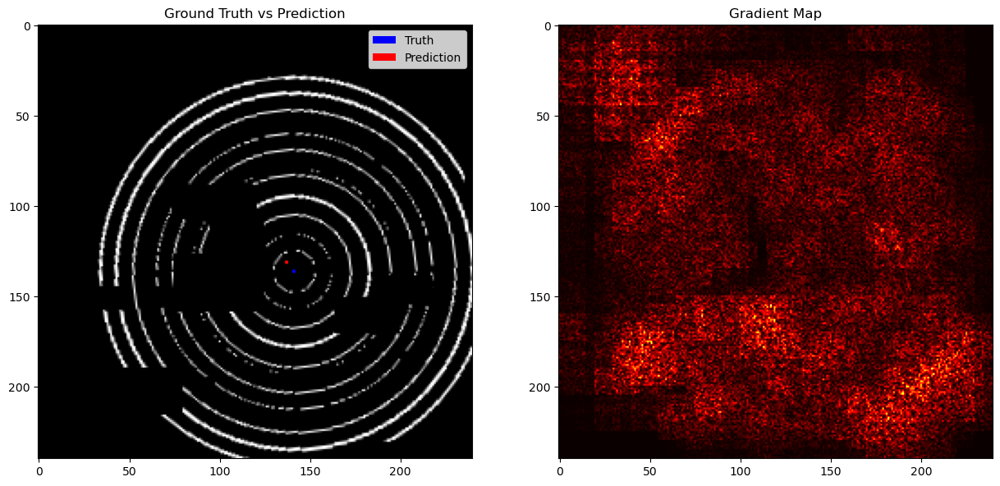

Epoch: 13 	Training Loss: 6.822943073024767e-05 	Validation Loss: 0.00010054660783175172
GROUND TRUTH center coordinate (x,y): [129, 136]
PREDICTED center coordinate (x,y): [129, 138]


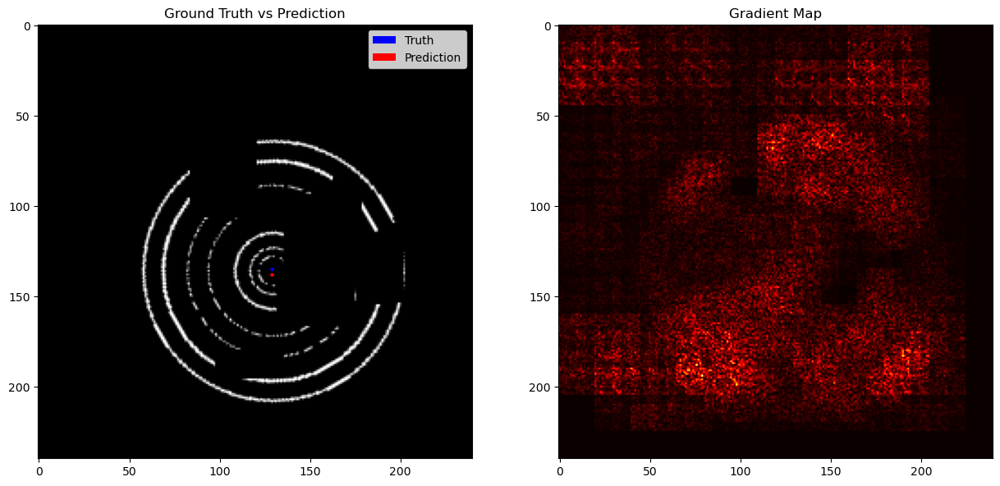

Epoch: 14 	Training Loss: 5.999713094853279e-05 	Validation Loss: 9.372771455673501e-05
GROUND TRUTH center coordinate (x,y): [131, 99]
PREDICTED center coordinate (x,y): [127, 97]


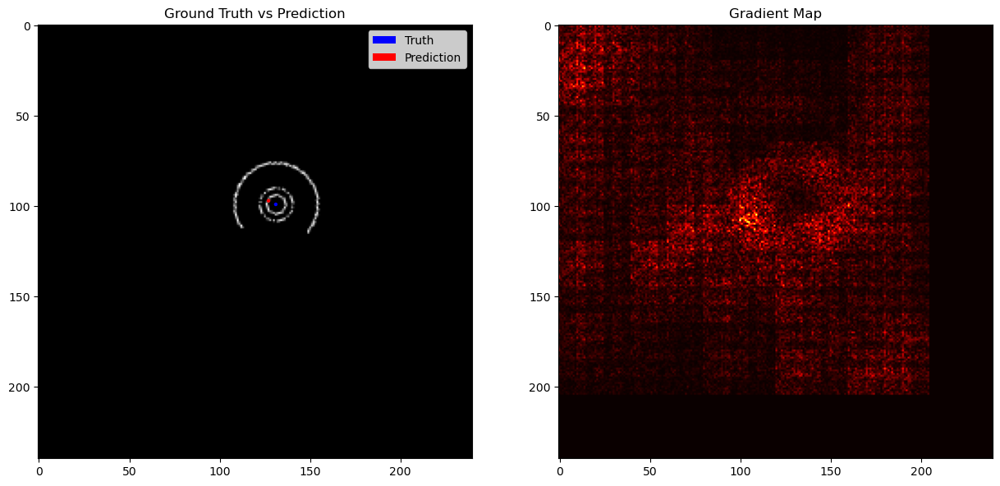

Epoch: 15 	Training Loss: 5.70752332957151e-05 	Validation Loss: 8.75783233722258e-05
GROUND TRUTH center coordinate (x,y): [117, 116]
PREDICTED center coordinate (x,y): [116, 115]


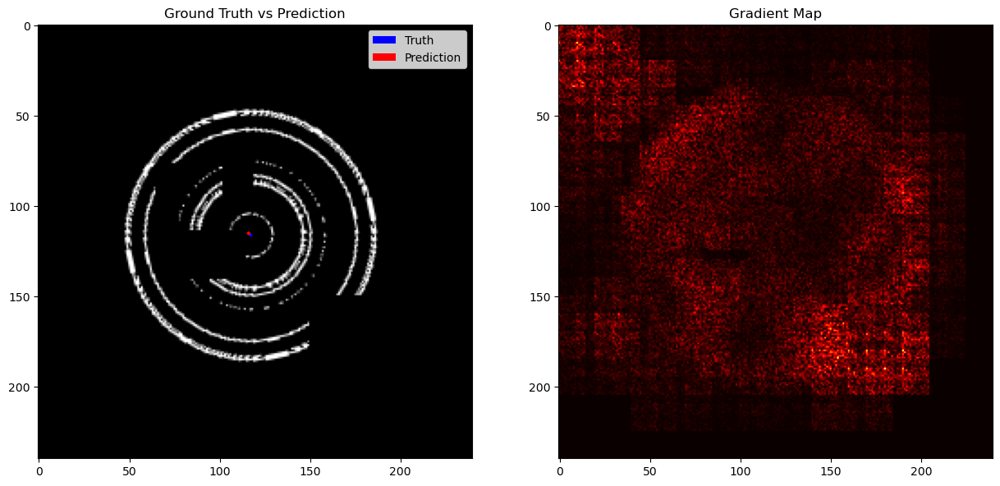

Epoch: 16 	Training Loss: 5.2819321151926284e-05 	Validation Loss: 8.815258236912389e-05
GROUND TRUTH center coordinate (x,y): [105, 139]
PREDICTED center coordinate (x,y): [104, 136]


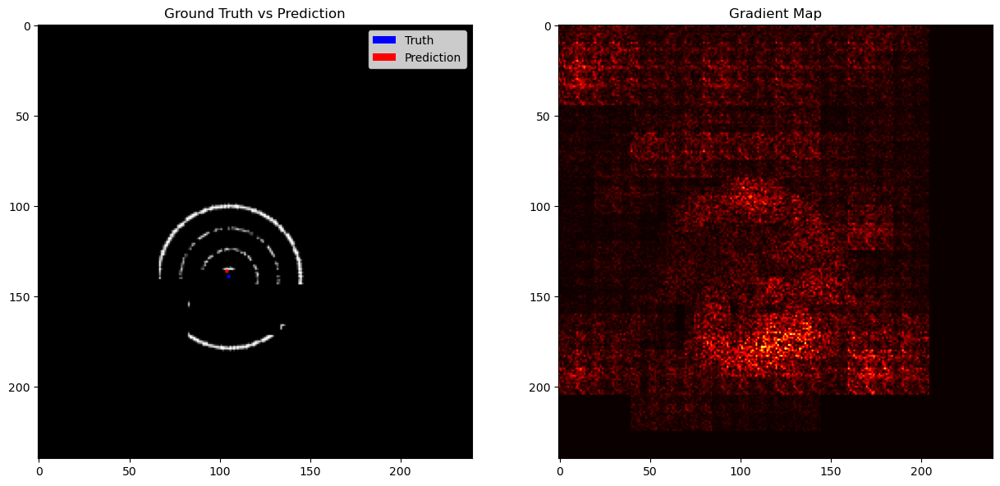

Epoch: 17 	Training Loss: 4.686003861327966e-05 	Validation Loss: 8.781065520856323e-05
GROUND TRUTH center coordinate (x,y): [118, 133]
PREDICTED center coordinate (x,y): [120, 132]


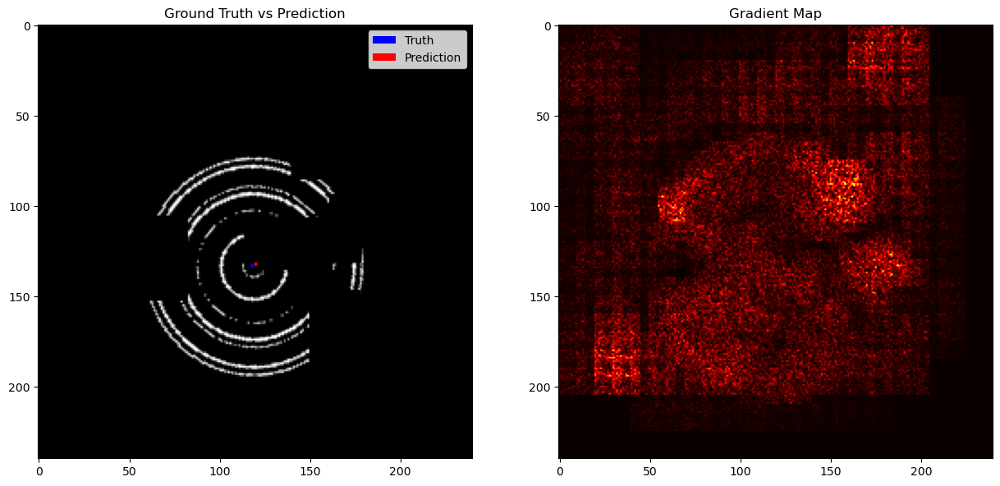

Epoch: 18 	Training Loss: 4.4822451147613014e-05 	Validation Loss: 8.329737384984683e-05
GROUND TRUTH center coordinate (x,y): [140, 123]
PREDICTED center coordinate (x,y): [141, 121]


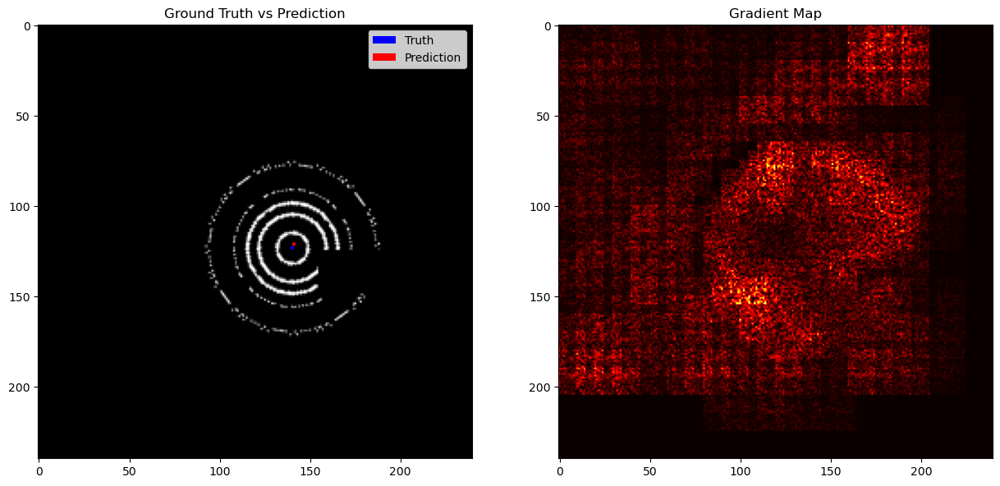

Epoch: 19 	Training Loss: 4.2801743095171536e-05 	Validation Loss: 7.974196018444168e-05
GROUND TRUTH center coordinate (x,y): [129, 137]
PREDICTED center coordinate (x,y): [128, 133]


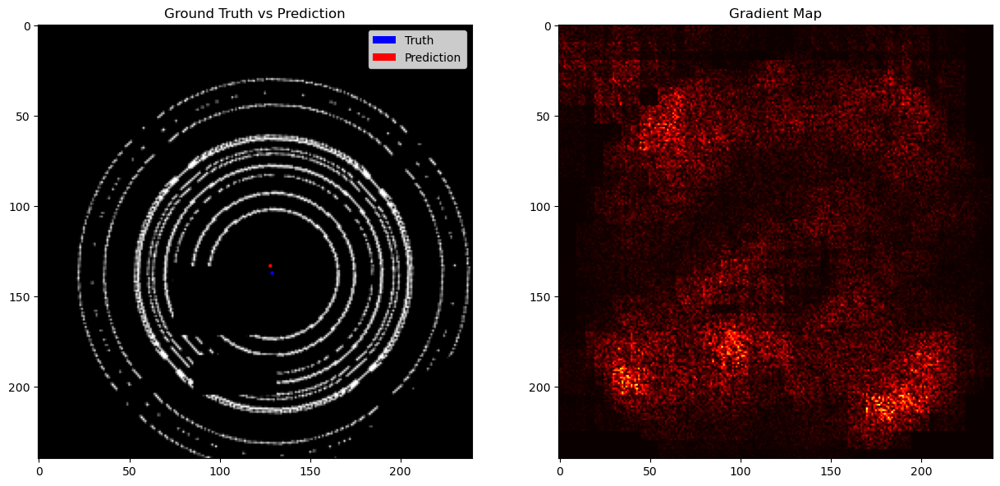

Epoch: 20 	Training Loss: 3.7444348385583405e-05 	Validation Loss: 7.646916532798464e-05
GROUND TRUTH center coordinate (x,y): [134, 98]
PREDICTED center coordinate (x,y): [134, 96]


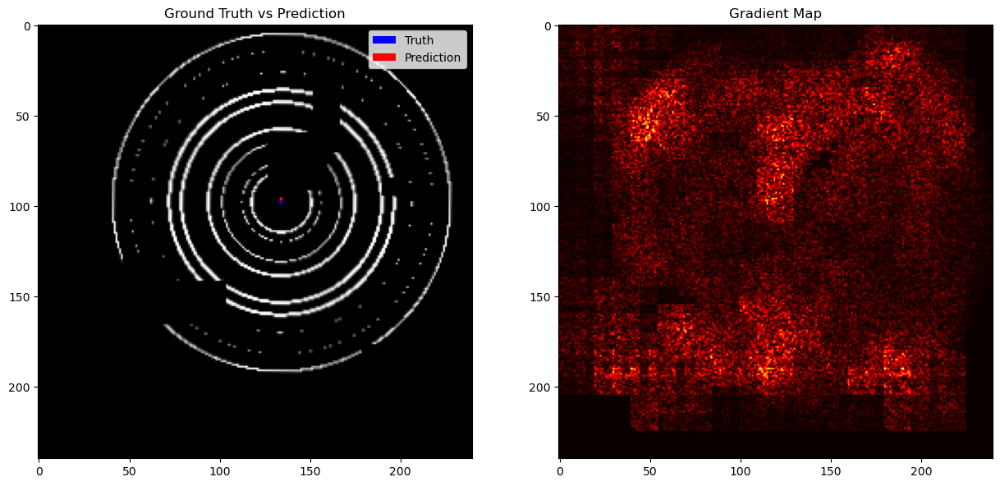

Epoch: 21 	Training Loss: 3.3920852527242256e-05 	Validation Loss: 7.526707364983547e-05
GROUND TRUTH center coordinate (x,y): [97, 116]
PREDICTED center coordinate (x,y): [94, 114]


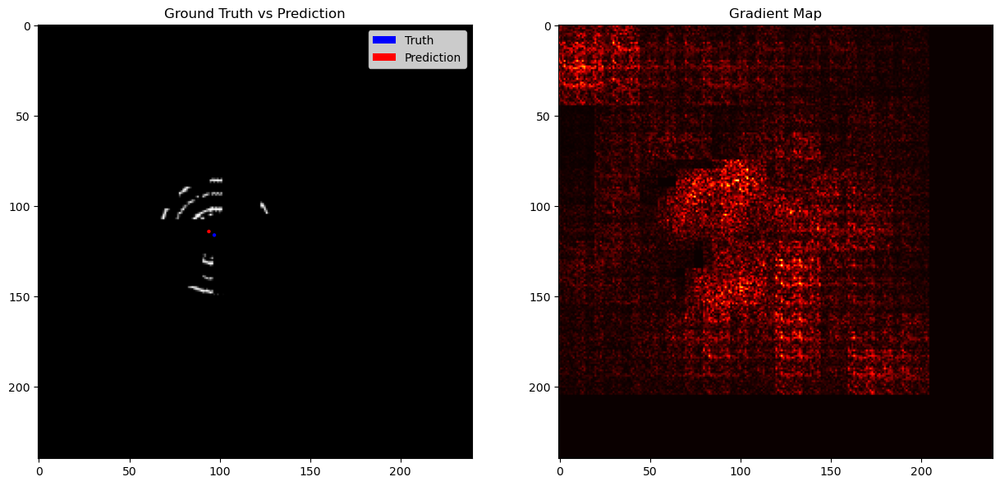

Epoch: 22 	Training Loss: 3.102120919922729e-05 	Validation Loss: 7.153184439327258e-05
GROUND TRUTH center coordinate (x,y): [142, 127]
PREDICTED center coordinate (x,y): [141, 126]


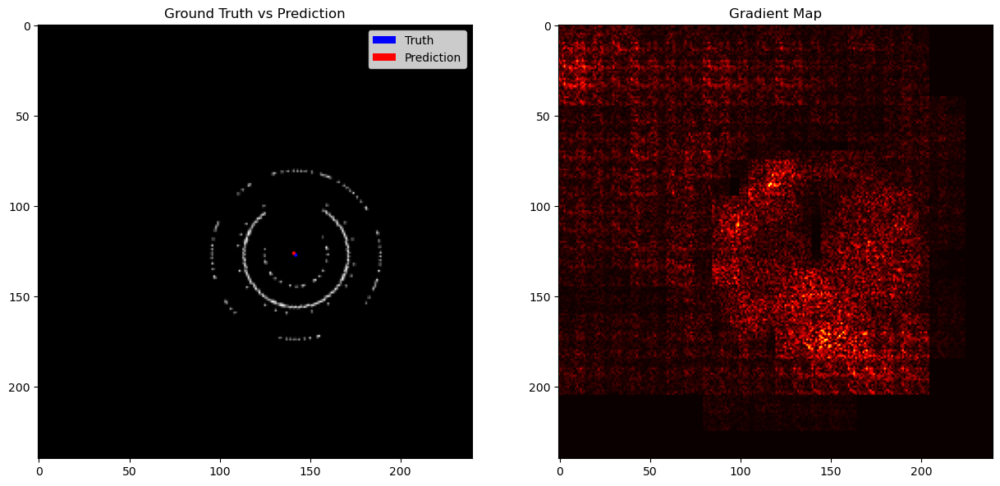

Epoch: 23 	Training Loss: 2.8063758792187502e-05 	Validation Loss: 7.142720076242565e-05
GROUND TRUTH center coordinate (x,y): [112, 108]
PREDICTED center coordinate (x,y): [110, 109]


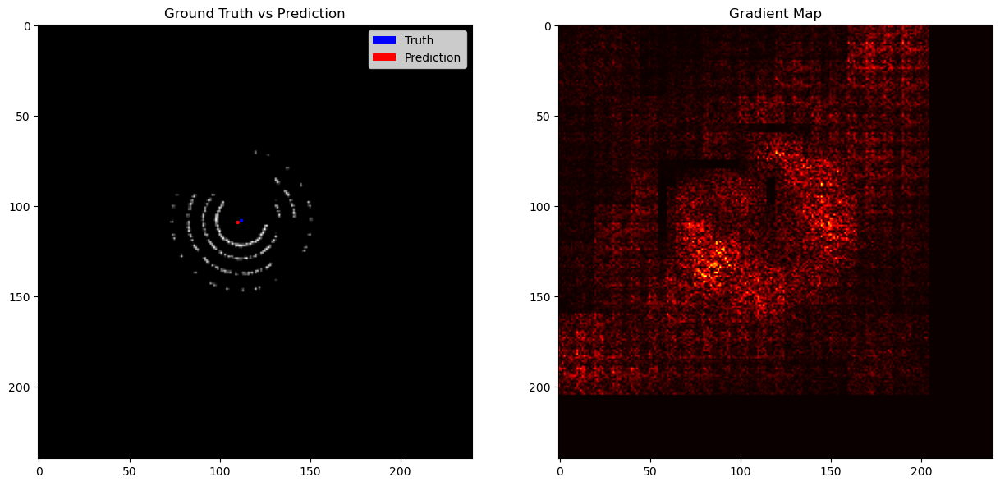

Epoch: 24 	Training Loss: 2.650307315990277e-05 	Validation Loss: 7.124977734444353e-05
GROUND TRUTH center coordinate (x,y): [95, 116]
PREDICTED center coordinate (x,y): [95, 116]


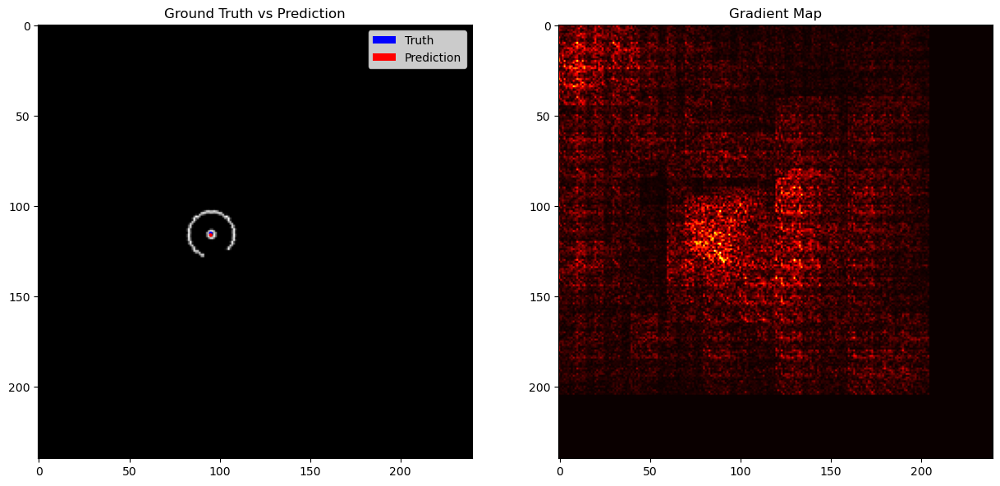

Epoch: 25 	Training Loss: 2.6198863350954423e-05 	Validation Loss: 7.202030368110475e-05


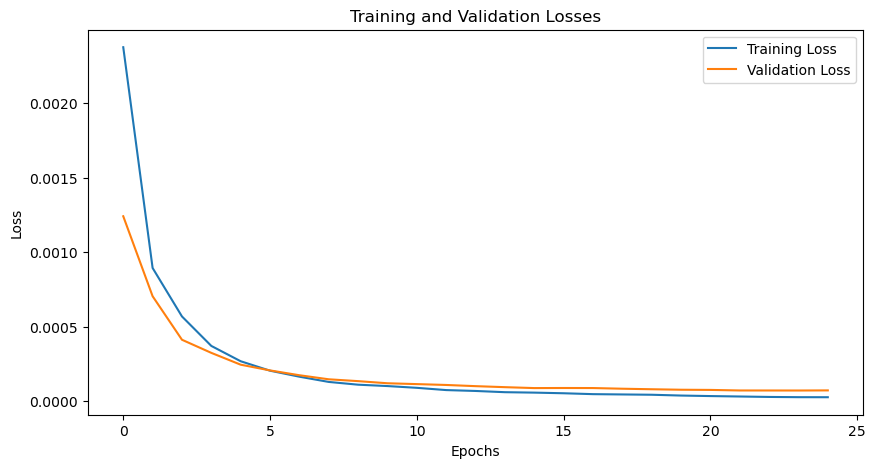

In [31]:
import torch.nn as nn

in_dim = 240
t_df = train_df
v_df = valid_df

#______________________________/Model Architecture\_______________________________
class CircleNet(nn.Module):
    def __init__(self):
        super(CircleNet, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(1, 30, kernel_size=int(in_dim/16), stride=5, padding=0),
            nn.MaxPool2d(kernel_size=4, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(30, 60, kernel_size=4, stride=2, padding=0),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.ReLU(inplace=True)
        )

        self.regressor = nn.Sequential(
            nn.Linear(60 * 5 * 5, 120),
            nn.ReLU(inplace=True),
            nn.Linear(120, 60),
            nn.ReLU(inplace=True),
            nn.Linear(60, 2),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.features(x)
        self.feature_maps = x.detach()
        x = x.view(x.size(0), -1)
        x = self.regressor(x)
        return x

#_______________________________\____________________/__________________________________

#_______________________________/Model Initialization\__________________________________
model = CircleNet()
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 25
visual_frequency = 1

train_losses = []
valid_losses = []

# Check if CUDA is available and set device to GPU if it is
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Move your model to the device
model = model.to(device)


#__________________________________/Training Sequence\_________________________________________
for epoch in range(num_epochs):

    train_loss = 0.0 # Initialize loss variables for current epoch
    valid_loss = 0.0 

    #---Train Step---#
    model.train()
    for images, targets, sample_ids in train_dataloader:

        images = images.to(device)   
        targets = targets.to(device) # load data to device (gpu if cuda, else cpu)

        outputs = model(images) # run input data through model --> predictions
        loss = criterion(outputs, targets) # evaluate predictions against ground truths using some criterion
 
        optimizer.zero_grad() # clear previous batch gradients

        loss.backward() # calculate gradients and perform back propogation
        optimizer.step() # update parameters in accordance with current gradient information

        train_loss += loss.item() * images.size(0) # Accumulate training batch loss into running total



    #---Validation Step---#
    model.eval()

    if epoch % visual_frequency == 0:
        visuals_displayed = True # Flag for visual aids at the epoch frequency basis

    for images, targets, sample_ids in valid_dataloader:

        images = images.to(device)
        targets = targets.to(device) # loading data

        outputs = model(images) # create predictions
        loss = criterion(outputs, targets) # evaluate predictions and determine loss

        valid_loss += loss.item() * images.size(0) # Accumulate validation batch loss into running total


        #-----------------------------/Visualizations\-----------------------------
        if visuals_displayed:
            
            image = images[0].unsqueeze(0)  # Choose one image from the batch
            image.requires_grad = True

            ex_output = model(image)  # Forward pass
            ex_loss = criterion(ex_output, targets[0].unsqueeze(0))  # Compute loss

            model.zero_grad()

            ex_loss.backward()  # Backward pass to compute gradients

            gradients = image.grad.abs().squeeze().cpu().numpy()  # Get the gradients

            # Resize the heatmap
            heatmap_pil = Image.fromarray(gradients)
            heatmap_resized = heatmap_pil.resize((in_dim, in_dim))

            # Convert back to numpy array
            heatmap = np.array(heatmap_resized)

            

            fig, axs = plt.subplots(1, 2, figsize=(15,7))  # create a figure with 3 subplots

            # Display original image with ground truth pixel highlighted
            image_np = images[0].squeeze().cpu().numpy()  # convert the image tensor to numpy array
            axs[0].imshow(image_np, cmap='gray')  # display the image

            ground_truth = targets[0].cpu().numpy()  # get the ground truth pixel coordinates
            print(f'GROUND TRUTH center coordinate (x,y): {[int(component) for component in dimension * ground_truth]}')
            predicted = ex_output[0].detach().cpu().numpy()  # get the predicted pixel coordinates
            print(f'PREDICTED center coordinate (x,y): {[int(component) for component in dimension *predicted]}')

            Truth = mpatches.Circle((int(dimension * ground_truth[0]),
                                     int(dimension * ground_truth[1])), radius=1, facecolor='blue')  # create a blue circle at ground truth pixel
            Prediction = mpatches.Circle((int(dimension * predicted[0]), 
                                          int(dimension * predicted[1])), radius=1, facecolor='red')  # create a red circle at predicted pixel
            
            axs[0].add_patch(Truth) 
            axs[0].add_patch(Prediction) # Add truth/predicted pixel markers

            proxy_T = mpatches.Circle((int(dimension * ground_truth[0]),
                                     int(dimension * ground_truth[1])), radius=1, facecolor='blue', label='Truth')
            proxy_P = mpatches.Circle((int(dimension * predicted[0]), 
                                          int(dimension * predicted[1])), radius=1, facecolor='red', label='Prediction')

            axs[0].legend(handles=[proxy_T, proxy_P])
            axs[0].set_title("Ground Truth vs Prediction")

            # Display gradient map
            axs[1].imshow(heatmap, cmap='hot')  # display the gradient map
            axs[1].set_title("Gradient Map")

            plt.show()

        visuals_displayed = False
        # ----------------------------------------------------------------------

    train_loss = train_loss / len(train_dataloader.dataset) # Calculate average training loss for the epoch across all batches
    valid_loss = valid_loss / len(valid_dataloader.dataset) # Calculate averagre validation loss for the epoch across all batches
    
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)


    print(f'Epoch: {epoch+1} \tTraining Loss: {train_loss} \tValidation Loss: {valid_loss}')

    write_to_df = False

plt.figure(figsize=(10,5))
plt.plot(train_losses, label='Training Loss')
plt.plot(valid_losses, label='Validation Loss')
plt.title('Training and Validation Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

#### Test Model Accuracy:

x,y labels as presented in tensor targets: [115, 122]
x,y labels as predicted by model: [117, 121]


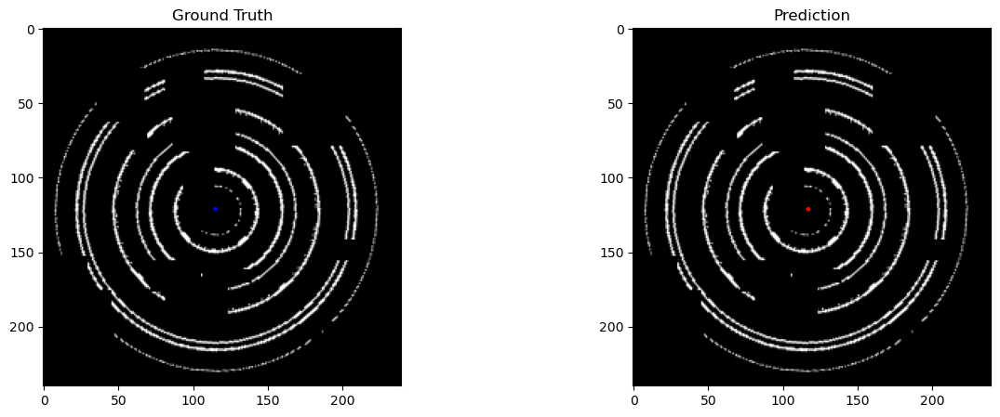

x,y labels as presented in tensor targets: [132, 130]
x,y labels as predicted by model: [132, 134]


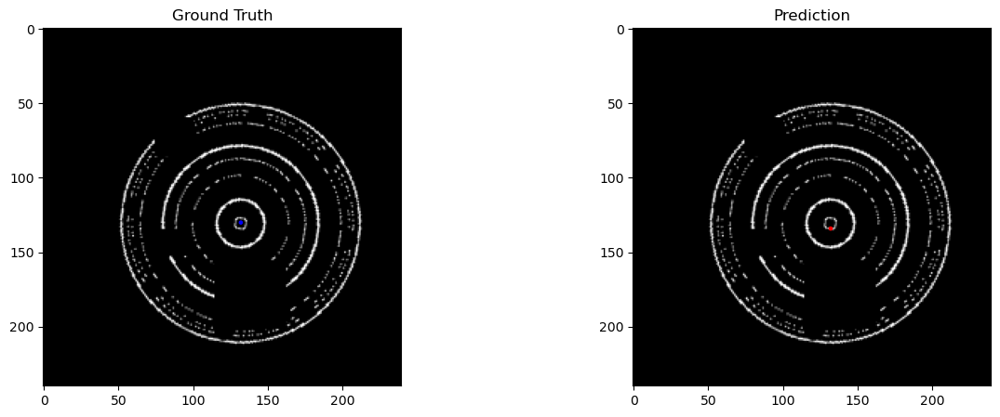

x,y labels as presented in tensor targets: [106, 105]
x,y labels as predicted by model: [105, 106]


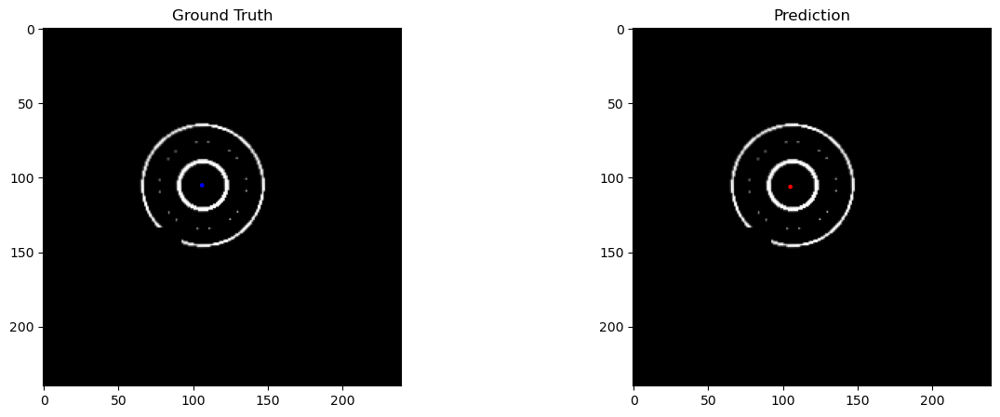

x,y labels as presented in tensor targets: [110, 142]
x,y labels as predicted by model: [110, 143]


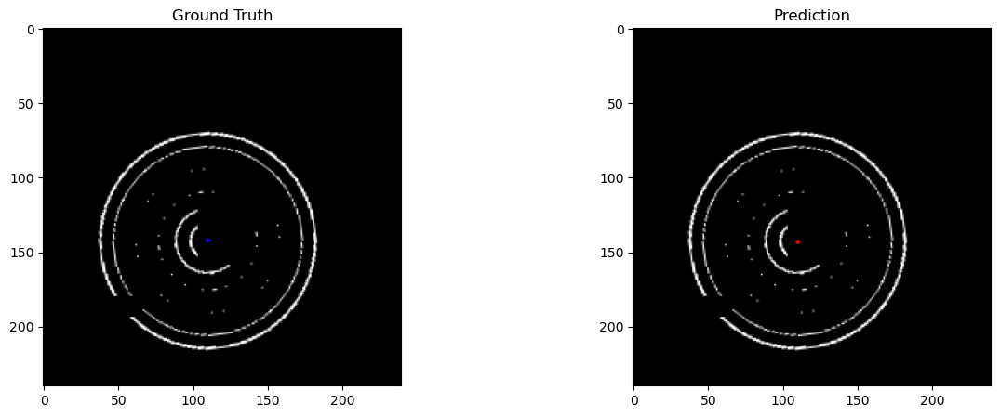

x,y labels as presented in tensor targets: [132, 108]
x,y labels as predicted by model: [132, 111]


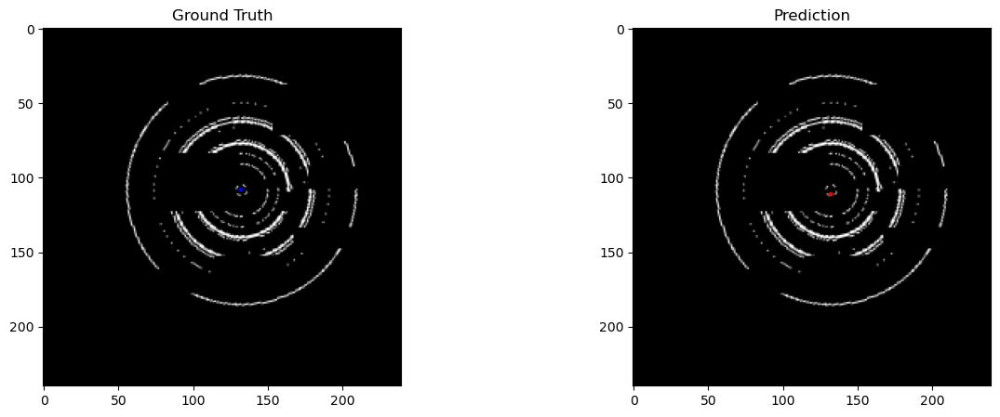

x,y labels as presented in tensor targets: [111, 119]
x,y labels as predicted by model: [112, 119]


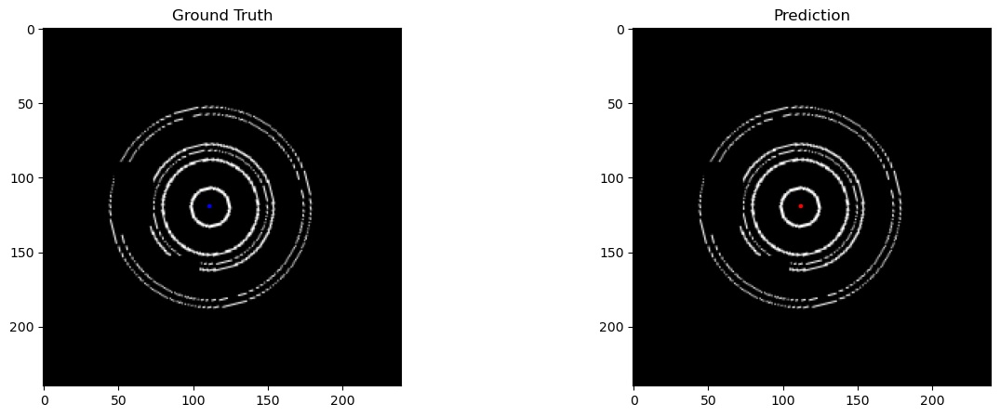

x,y labels as presented in tensor targets: [101, 124]
x,y labels as predicted by model: [100, 125]


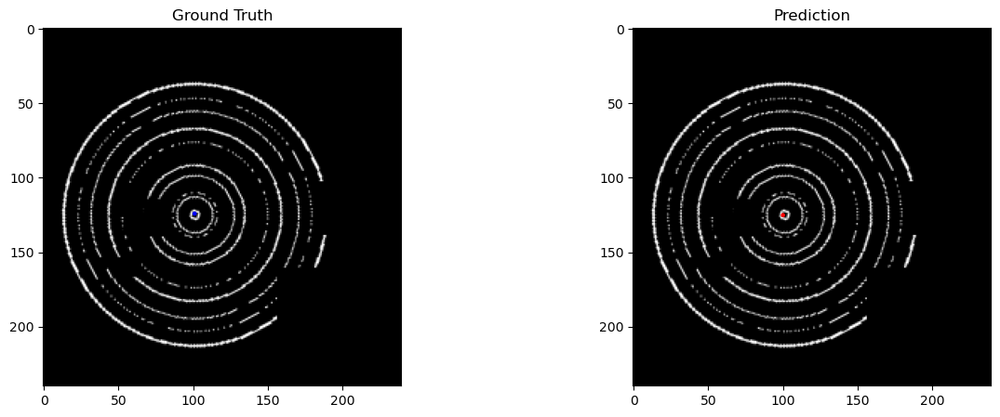

x,y labels as presented in tensor targets: [134, 99]
x,y labels as predicted by model: [133, 100]


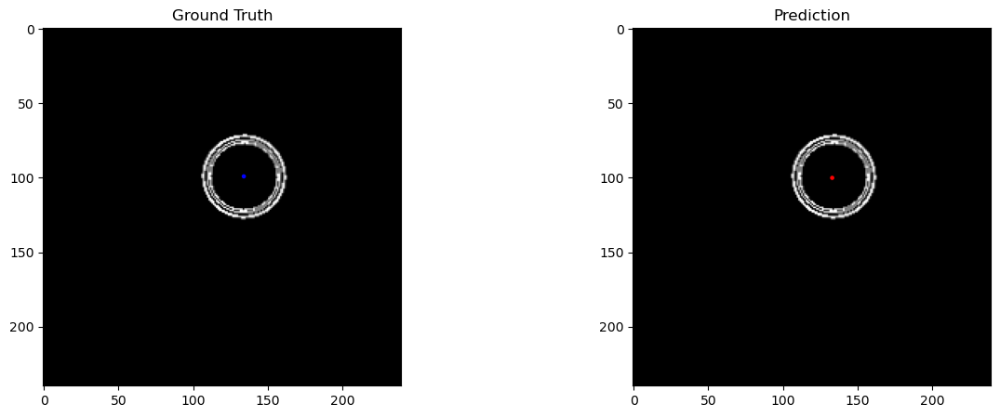

x,y labels as presented in tensor targets: [118, 138]
x,y labels as predicted by model: [117, 134]


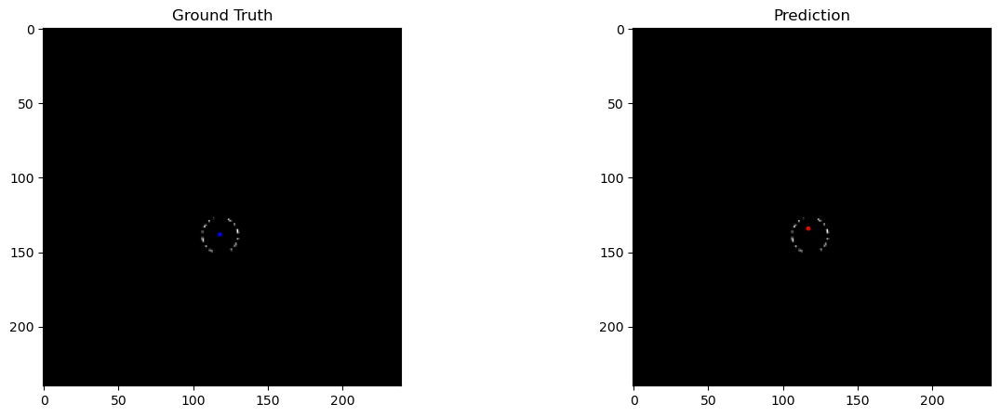

x,y labels as presented in tensor targets: [105, 112]
x,y labels as predicted by model: [104, 114]


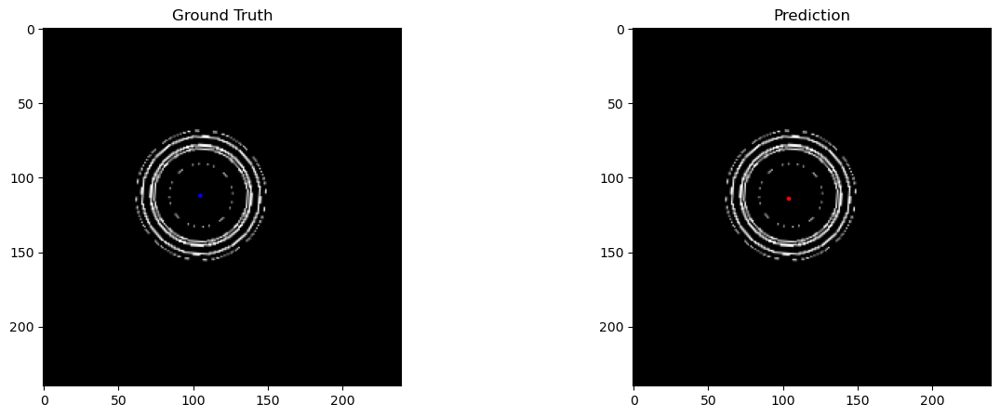

x,y labels as presented in tensor targets: [92, 109]
x,y labels as predicted by model: [93, 109]


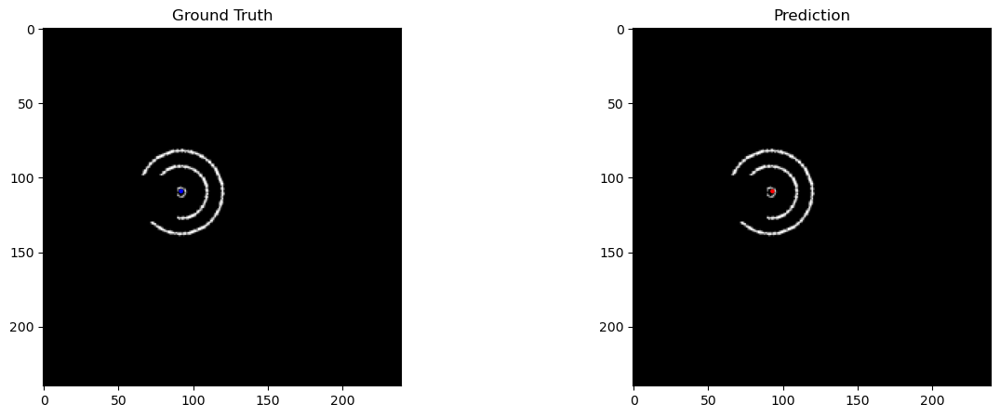

x,y labels as presented in tensor targets: [100, 116]
x,y labels as predicted by model: [103, 116]


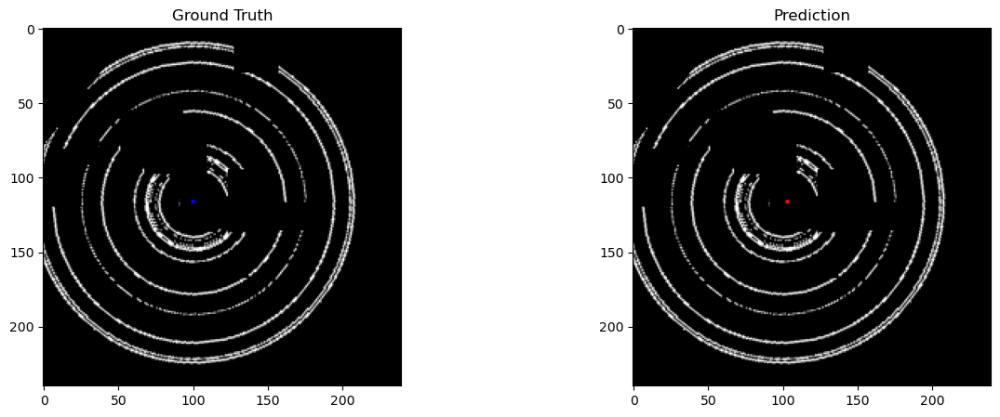

x,y labels as presented in tensor targets: [139, 123]
x,y labels as predicted by model: [137, 123]


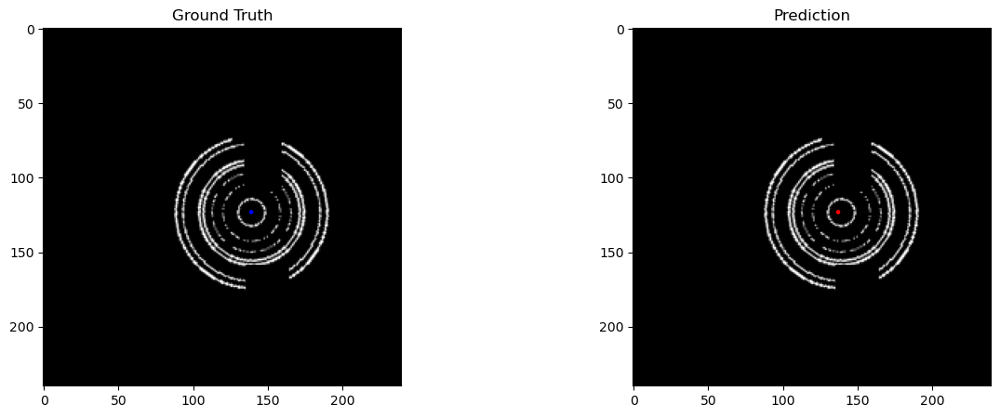

x,y labels as presented in tensor targets: [140, 127]
x,y labels as predicted by model: [141, 125]


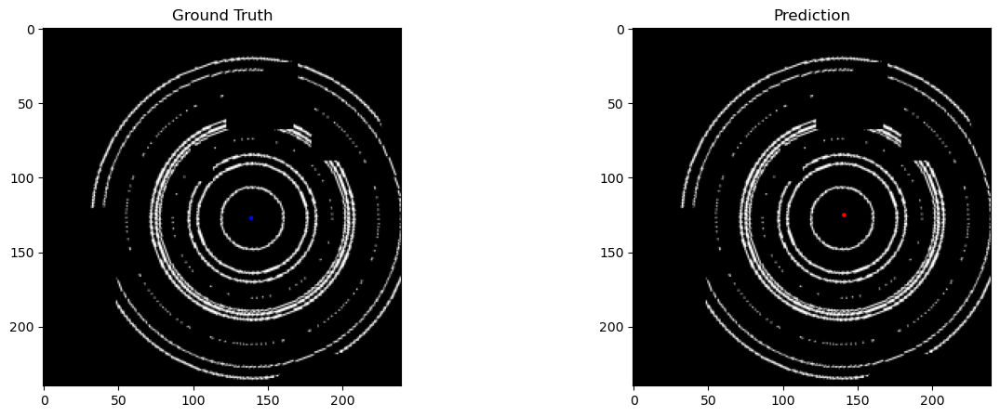

x,y labels as presented in tensor targets: [129, 138]
x,y labels as predicted by model: [129, 139]


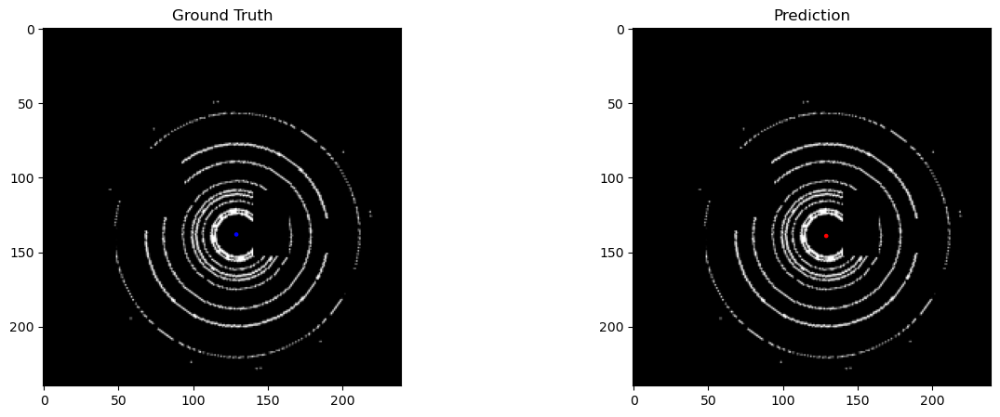

x,y labels as presented in tensor targets: [118, 135]
x,y labels as predicted by model: [119, 134]


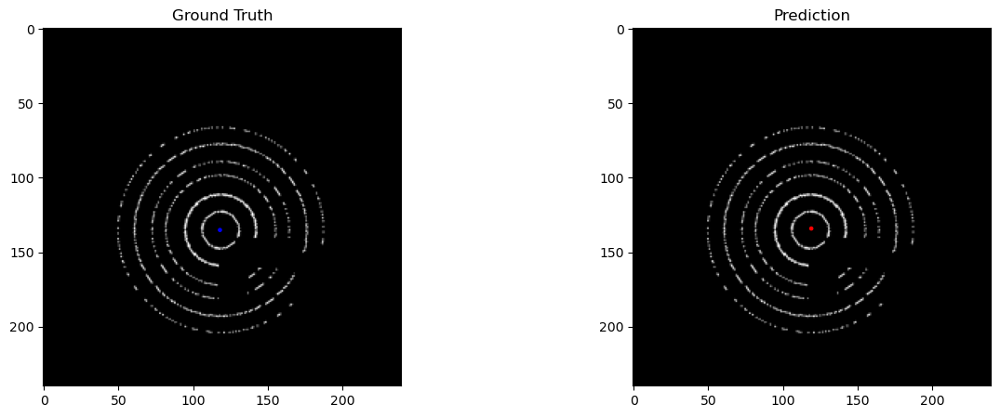

x,y labels as presented in tensor targets: [116, 126]
x,y labels as predicted by model: [115, 126]


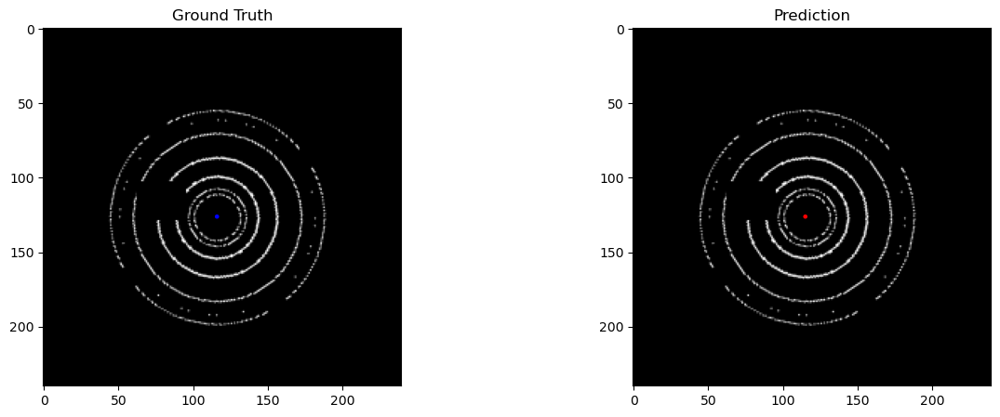

x,y labels as presented in tensor targets: [140, 117]
x,y labels as predicted by model: [143, 116]


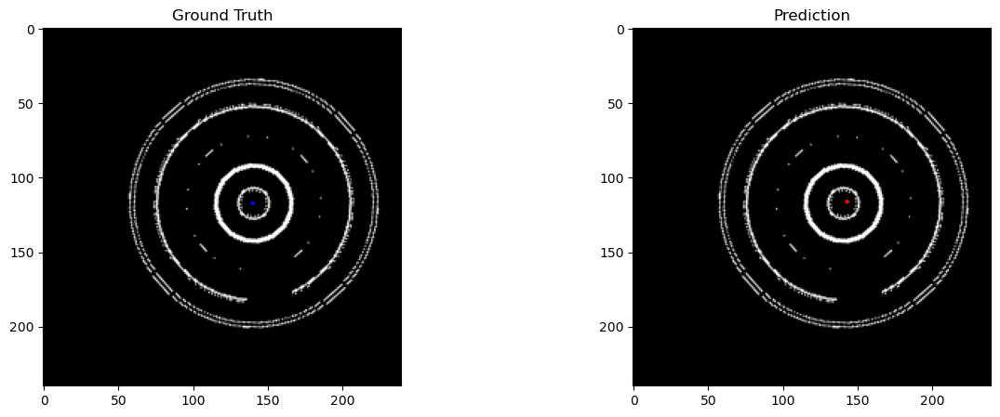

x,y labels as presented in tensor targets: [127, 135]
x,y labels as predicted by model: [126, 133]


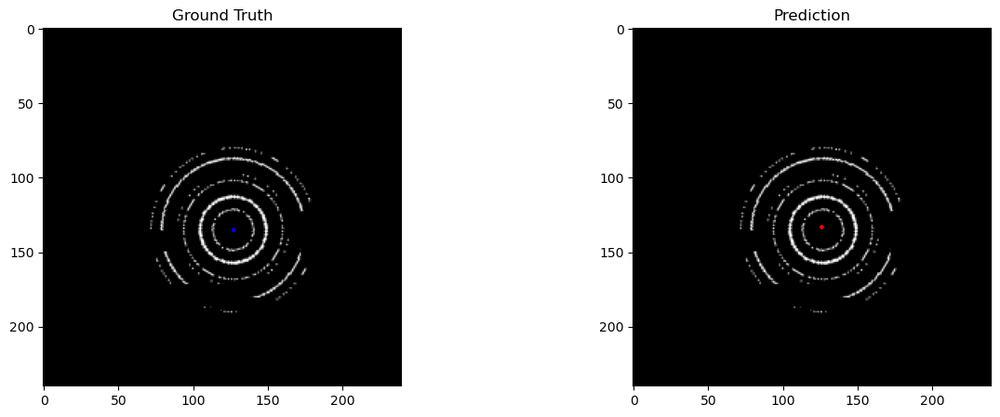

x,y labels as presented in tensor targets: [132, 106]
x,y labels as predicted by model: [129, 107]


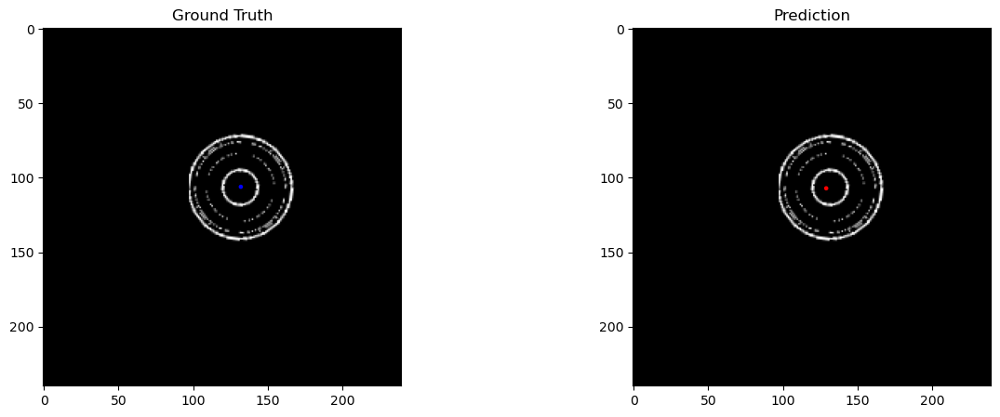

Test Loss: 7.202192136901431e-05
Test Accuracy: 0.9930000603199005


In [16]:
model.eval()

test_loss = 0
correct_predictions = 0

with torch.no_grad():
    for images, targets, samples_ids in test_dataloader:

        images = images.to(device)
        targets = targets.to(device)

        outputs = model(images)

        loss = criterion(outputs, targets)

        test_loss += loss.item()

        correct_predictions += torch.isclose(outputs, targets, atol=0.03).float().mean().item()

        image_array = images.cpu().squeeze().numpy()[::25, :, :]
        truth_array = targets.cpu().numpy()[::25, :]
        output_array = outputs.cpu().numpy()[::25, :]

        for i in range(len(image_array)):

            fig, axs = plt.subplots(1, 2, figsize=(15,5))  # create a figure with 2 subplots

            # Display original image with ground truth pixel highlighted
            image_dim = 240
            axs[0].imshow(image_array[i], cmap='gray')  # display the image
            ground_truth = truth_array[i]  # get the ground truth pixel coordinates
            print(f'x,y labels as presented in tensor targets: {[int(item) for item in dimension * ground_truth]}')
            circle1 = Circle((int(image_dim * ground_truth[0]),
                                int(image_dim * ground_truth[1])), radius=1, color='b')  # create a blue circle at ground truth pixel
            axs[0].add_patch(circle1)  # add the circle to the plot
            axs[0].set_title("Ground Truth")

            # Display original image with predicted pixel highlighted
            predicted = output_array[i]  # get the predicted pixel coordinates
            print(f'x,y labels as predicted by model: {[int(item) for item in dimension * predicted]}')
            circle2 = Circle((int(image_dim * predicted[0]), 
                                int(image_dim * predicted[1])), radius=1, color='r')  # create a red circle at predicted pixel
            axs[1].imshow(image_array[i], cmap='gray')  # display the image
            axs[1].add_patch(circle2)  # add the circle to the plot
            axs[1].set_title("Prediction")

            plt.show()
            # print(f'Predicting {abs(outputs - targets)*240}')

    test_loss /= len(test_dataloader)
    correct_predictions /= len(test_dataloader)

    print(f'Test Loss: {test_loss}')
    print(f'Test Accuracy: {correct_predictions}')

